<div style="background-color:#818274; padding: 25px; border-radius: 10px; font-size: 20px; font-family: 'Trebuchet MS', serif; text-align: center;">
  <h1 style="color: #FFFFFF;">📊Performance Analysis of Five Stocks📊</h1>
</div>

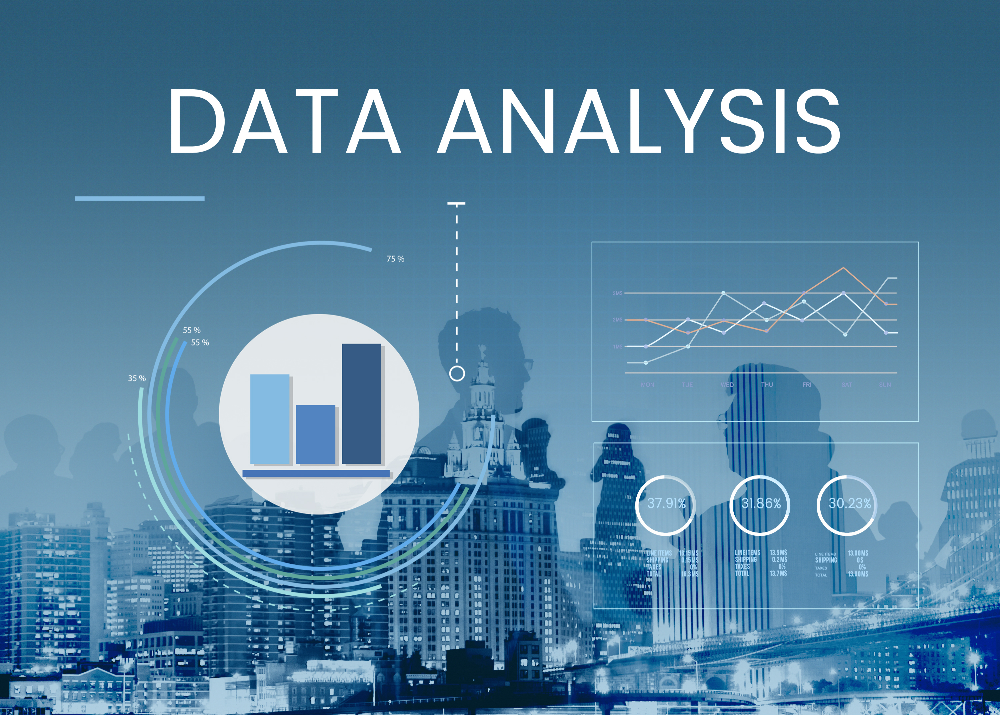

<div style="background-color:#818274; padding: 25px; border-radius: 10px; font-size: 20px; font-family: 'Trebuchet MS', serif; text-align: center;">
  <h1 style="color: #FFFFFF;">Exploratory Data Analysis</h1>
</div>

In [1]:
# real-time stock market data form yfinance
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings                     # to ignore warnings
warnings.filterwarnings("ignore")

### ⬇️Fetching real time data form yfinance 

In [2]:
# Define the stock symbols and names (Indian stocks typically end with .NS)
stocks = {
    'TITAGARH.NS': 'Titagarh',
    'TCS.NS': 'Tcs',
    'MOTHERSON.NS': 'Motherson',
    'CDSL.NS': 'Cdsl',
    'HDFCBANK.NS': 'Hdfc'
}
# Set date range for historical data
start_date = '2022-01-01'
end_date = '2025-3-31'

In [3]:
# Download data and save as separate CSV files
for symbol, name in stocks.items():
    try:
        data = yf.download(symbol, start=start_date, end=end_date)    # Download stock data
        data['Stock Name'] = name                                     # Add stock name column
        filename = f"{name.replace(' ', '_')}_data.csv"               # Save to CSV
        data.to_csv(filename)
        print(f"Data saved for {name} in {filename}")
    except Exception as e:
        print(f"Error downloading {name}: {str(e)}")

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed


Data saved for Titagarh in Titagarh_data.csv


[*********************100%***********************]  1 of 1 completed


Data saved for Tcs in Tcs_data.csv


[*********************100%***********************]  1 of 1 completed


Data saved for Motherson in Motherson_data.csv


[*********************100%***********************]  1 of 1 completed


Data saved for Cdsl in Cdsl_data.csv


[*********************100%***********************]  1 of 1 completed

Data saved for Hdfc in Hdfc_data.csv


<div style="background-color:#818274; padding: 25px; border-radius: 10px; font-size: 20px; font-family: 'Trebuchet MS', serif; text-align: center;">
  <h1 style="color: #FFFFFF;">🔁Combine files in one dataframe</h1>
</div>

In [4]:
# List of all file names
file_names = [
    'Motherson_data.csv',
    'Tcs_data.csv',
    'Hdfc_data.csv',
    'Cdsl_data.csv',
    'Titagarh_data.csv'
]

In [5]:
# Create an empty list to store each DataFrame
dataframes = []
for file in file_names:      # Loop through each file name in the list 'file_names'
    try:
        df = pd.read_csv(file)
        df['Stock Name'] = file.replace('_data.csv', '')  # Add Stock Name from file name
        dataframes.append(df)
    except Exception as e:
        print(f"Error reading {file}: {e}")  # If there's an error reading the file, print the error message

In [6]:
# Combine all DataFrames into one
combined_df = pd.concat(dataframes, ignore_index=True)

In [7]:
combined_df.head()

,Price,Close,High,Low,Open,Volume,Stock Name
0,Ticker,MOTHERSON.NS,MOTHERSON.NS,MOTHERSON.NS,MOTHERSON.NS,MOTHERSON.NS,Motherson
1,Date,NaN,NaN,NaN,NaN,NaN,Motherson
2,2022-01-03,90.29716491699219,90.51803758837588,89.25303616315185,89.67470828893217,10946036,Motherson
3,2022-01-04,90.27708435058594,91.44169726433306,89.8353390071989,90.61844118072153,9662815,Motherson
4,2022-01-05,89.9959716796875,92.68661244088821,89.47390359530827,90.71883173064734,18545657,Motherson


In [8]:
# to remove Ticker and Date rows in file and i give same name as combined_df
combined_df = combined_df[~combined_df.apply(lambda row: row.astype(str).str.contains("date|ticker", case=False)).any(axis=1)]
# Keep only the rows in combined_df where no cell contains the word 'date' or 'ticker' 

In [9]:
combined_df.head()

,Price,Close,High,Low,Open,Volume,Stock Name
2,2022-01-03,90.29716491699219,90.51803758837588,89.25303616315185,89.67470828893217,10946036,Motherson
3,2022-01-04,90.27708435058594,91.44169726433306,89.8353390071989,90.61844118072153,9662815,Motherson
4,2022-01-05,89.9959716796875,92.68661244088821,89.47390359530827,90.71883173064734,18545657,Motherson
5,2022-01-06,93.50988006591797,93.97170613193268,88.75105454525992,89.55422998719597,25203833,Motherson
6,2022-01-07,95.9394760131836,96.94345080677364,93.3492312131603,94.29296393062705,34969236,Motherson


In [10]:
combined_df.reset_index(drop=True, inplace=True) # Reset index

In [11]:
combined_df.tail()

,Price,Close,High,Low,Open,Volume,Stock Name
4000,2025-03-24,820.9000244140625,831.9000244140625,795.1500244140625,799.0,4399836,Titagarh
4001,2025-03-25,812.5,836.9500122070312,800.2000122070312,824.9000244140625,3032387,Titagarh
4002,2025-03-26,803.0,820.75,800.0499877929688,808.7999877929688,1566445,Titagarh
4003,2025-03-27,815.2000122070312,820.0,789.25,799.9500122070312,1994444,Titagarh
4004,2025-03-28,796.25,831.0,791.5999755859375,820.0,1764410,Titagarh


In [12]:
combined_df.rename(columns={'Price': 'Date'}, inplace=True) # Rename 'Price' to 'Date'

In [13]:
cols = combined_df.columns.tolist()                 #Move 'Stock Name' to come after 'Price'
cols.insert(1, cols.pop(cols.index('Stock Name')))
combined_df = combined_df[cols]

In [14]:
combined_df.head()

,Date,Stock Name,Close,High,Low,Open,Volume
0,2022-01-03,Motherson,90.29716491699219,90.51803758837588,89.25303616315185,89.67470828893217,10946036
1,2022-01-04,Motherson,90.27708435058594,91.44169726433306,89.8353390071989,90.61844118072153,9662815
2,2022-01-05,Motherson,89.9959716796875,92.68661244088821,89.47390359530827,90.71883173064734,18545657
3,2022-01-06,Motherson,93.50988006591797,93.97170613193268,88.75105454525992,89.55422998719597,25203833
4,2022-01-07,Motherson,95.9394760131836,96.94345080677364,93.3492312131603,94.29296393062705,34969236


In [15]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4005 entries, 0 to 4004
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Date        4005 non-null   object
 1   Stock Name  4005 non-null   object
 2   Close       4005 non-null   object
 3   High        4005 non-null   object
 4   Low         4005 non-null   object
 5   Open        4005 non-null   object
 6   Volume      4005 non-null   object
dtypes: object(7)
memory usage: 219.2+ KB


<div style="background-color:#818274; padding: 25px; border-radius: 10px; font-size: 20px; font-family: 'Trebuchet MS', serif; text-align: center;">
  <h1 style="color: #FFFFFF;">🔀Converting Datatype</h1>
</div>

In [16]:
combined_df['Date'] = pd.to_datetime(combined_df['Date'])                    # Convert 'Date' column to datetime

In [17]:
for col in ['Close', 'High', 'Low', 'Open']:     #Convert only selected columns to float
   combined_df[col] = combined_df[col].astype(float)

In [18]:
combined_df['Volume'] = combined_df['Volume'].astype(int)         #Convert 'Volume' column to int

In [19]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4005 entries, 0 to 4004
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Date        4005 non-null   datetime64[ns]
 1   Stock Name  4005 non-null   object        
 2   Close       4005 non-null   float64       
 3   High        4005 non-null   float64       
 4   Low         4005 non-null   float64       
 5   Open        4005 non-null   float64       
 6   Volume      4005 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1), object(1)
memory usage: 219.2+ KB


<div style="background-color:#818274; padding: 25px; border-radius: 10px; font-size: 20px; font-family: 'Trebuchet MS', serif; text-align: center;">
  <h1 style="color: #FFFFFF;"> ➕Adding Month,Weekdays and Daily return Column</h1>
</div>

In [20]:
combined_df['Month'] = combined_df['Date'].dt.strftime('%B')   # Add 'Month' column

In [21]:
combined_df['weekdays'] = combined_df['Date'].dt.strftime('%A') # Add 'Weekdays' column

In [22]:
combined_df['Daily return'] = combined_df.groupby('Stock Name')['Close'].pct_change()*100   # add 'Daily return' column in %

In [23]:
combined_df.head().round(2)

,Date,Stock Name,Close,High,Low,Open,Volume,Month,weekdays,Daily return
0,2022-01-03,Motherson,90.30,90.52,89.25,89.67,10946036,January,Monday,NaN
1,2022-01-04,Motherson,90.28,91.44,89.84,90.62,9662815,January,Tuesday,-0.02
2,2022-01-05,Motherson,90.00,92.69,89.47,90.72,18545657,January,Wednesday,-0.31
3,2022-01-06,Motherson,93.51,93.97,88.75,89.55,25203833,January,Thursday,3.90
4,2022-01-07,Motherson,95.94,96.94,93.35,94.29,34969236,January,Friday,2.60


In [24]:
combined_df = combined_df[combined_df['weekdays'] != 'Saturday'] 


<div style="background-color:#818274; padding: 25px; border-radius: 10px; font-size: 20px; font-family: 'Trebuchet MS', serif; text-align: center;">
  <h1 style="color: #FFFFFF;">🔎 Checking if there are missing values in the dataset</h1>
</div>

In [25]:
combined_df.duplicated().sum()

np.int64(0)

In [26]:
combined_df.isnull().sum()    # checking missing values

Date            0
Stock Name      0
Close           0
High            0
Low             0
Open            0
Volume          0
Month           0
weekdays        0
Daily return    5
dtype: int64

#### 🛠

In [27]:
combined_df = combined_df.dropna(subset=['Daily return']) # remove Null values 

In [28]:
combined_df.round(2).head()

,Date,Stock Name,Close,High,Low,Open,Volume,Month,weekdays,Daily return
1,2022-01-04,Motherson,90.28,91.44,89.84,90.62,9662815,January,Tuesday,-0.02
2,2022-01-05,Motherson,90.00,92.69,89.47,90.72,18545657,January,Wednesday,-0.31
3,2022-01-06,Motherson,93.51,93.97,88.75,89.55,25203833,January,Thursday,3.90
4,2022-01-07,Motherson,95.94,96.94,93.35,94.29,34969236,January,Friday,2.60
5,2022-01-10,Motherson,96.38,98.65,95.94,96.78,19399782,January,Monday,0.46


In [29]:
combined_df.reset_index(drop=True, inplace=True)

In [30]:
zero_counts = (combined_df[cols] == 0).sum()   # cheking Zero values in dataset
zero_counts

Date          0
Stock Name    0
Close         0
High          0
Low           0
Open          0
Volume        7
dtype: int64

In [31]:
combined_df[combined_df['Volume'] == 0]  # finding rows where volume is Zero 

,Date,Stock Name,Close,High,Low,Open,Volume,Month,weekdays,Daily return
502,2024-01-15,Motherson,106.519226,106.519226,106.519226,106.519226,0,January,Monday,0.0
790,2025-03-18,Motherson,120.531395,120.531395,120.531395,120.531395,0,March,Tuesday,0.0
1589,2025-03-18,Tcs,3466.885010,3466.885010,3466.885010,3466.885010,0,March,Tuesday,0.0
2388,2025-03-18,Hdfc,1710.400024,1710.400024,1710.400024,1710.400024,0,March,Tuesday,0.0
3187,2025-03-18,Cdsl,1058.199951,1058.199951,1058.199951,1058.199951,0,March,Tuesday,0.0
3698,2024-01-15,Titagarh,1048.131226,1048.131226,1048.131226,1048.131226,0,January,Monday,0.0
3986,2025-03-18,Titagarh,690.700012,690.700012,690.700012,690.700012,0,March,Tuesday,0.0


#### 🛠

In [32]:
combined_df = combined_df[combined_df['Volume'] != 0]     # remove Zeros form volume

<div style="background-color:#818274; padding: 25px; border-radius: 10px; font-size: 20px; font-family: 'Trebuchet MS', serif; text-align: center;">
  <h1 style="color: #FFFFFF;">📄Information About the dataset</h1>
</div>

In [33]:
# FINAL DATASET ✅

In [34]:
combined_df.shape

(3988, 10)

In [35]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3988 entries, 0 to 3994
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          3988 non-null   datetime64[ns]
 1   Stock Name    3988 non-null   object        
 2   Close         3988 non-null   float64       
 3   High          3988 non-null   float64       
 4   Low           3988 non-null   float64       
 5   Open          3988 non-null   float64       
 6   Volume        3988 non-null   int64         
 7   Month         3988 non-null   object        
 8   weekdays      3988 non-null   object        
 9   Daily return  3988 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(1), object(3)
memory usage: 342.7+ KB


<div style="background-color:#818274; padding: 25px; border-radius: 10px; font-size: 20px; font-family: 'Trebuchet MS', serif; text-align: center;">
  <h1 style="color: #FFFFFF;"> 🔎 Basic Summary of Statistics</h1>
</div>

In [36]:
combined_df.describe().round(2)

,Date,Close,High,Low,Open,Volume,Daily return
count,3988,3988.00,3988.00,3988.00,3988.00,3.988000e+03,3988.00
mean,2023-08-15 11:50:58.375125504,1337.01,1353.01,1322.66,1338.04,7.500123e+06,0.11
min,2022-01-04 00:00:00,61.17,62.11,60.88,61.52,6.920800e+04,-19.79
25%,2022-10-24 00:00:00,198.11,202.11,194.93,198.57,1.285522e+06,-1.01
50%,2023-08-11 00:00:00,1045.73,1069.92,1028.06,1050.40,2.963348e+06,0.00
75%,2024-06-10 00:00:00,1656.34,1672.91,1642.92,1655.89,1.005113e+07,1.06
max,2025-03-28 00:00:00,4491.94,4529.92,4450.76,4513.89,4.633230e+08,28.55
std,NaN,1233.38,1243.63,1223.33,1233.55,1.450228e+07,2.25


In [37]:
# The dataset  from January-4-2022 to march-28-2023, comprising 3,988 records that capture stock market performance over this period
# The average closing price across all stocks is approximately ₹1333.45, with values ranging widely from ₹61.17 to ₹4471.39, a mix of both low and high value stocks 
# High standard deviations in price metrics (₹1227.30 for closing prices) suggest significant price volatility 
# Trading volume also varies greatly—averaging around 7.5 million but peaking at 463 million—implying uneven liquidity across the stocks
# The mean daily return is at 0.11%, but the wide return range (from -19.79% to 28.55%) reflects day-to-day fluctuations
# The median daily return is 0.00%,they are not the norm, and the return distribution may be skewed due to a few outliers

<div style="background-color:#818274; padding: 25px; border-radius: 10px; font-size: 20px; font-family: 'Trebuchet MS', serif; text-align: center;">
  <h1 style="color: #FFFFFF;"> 📊 Visualization</h1>
</div>

### ▶️Analysis stocks price with volumes

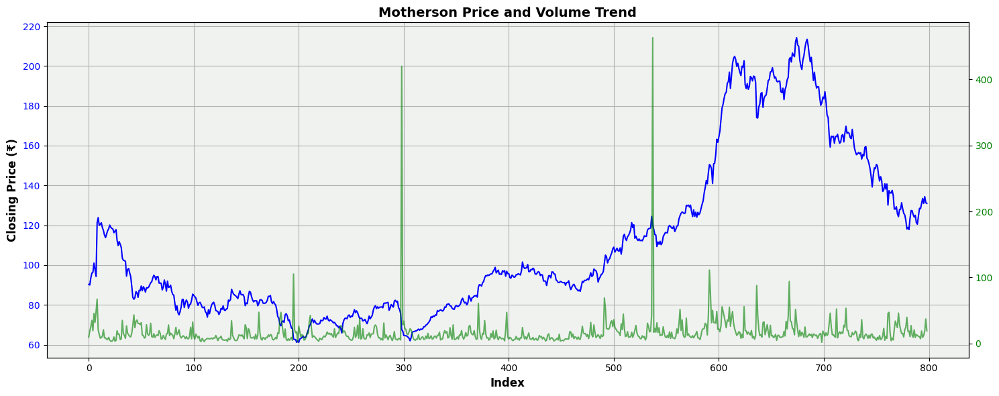

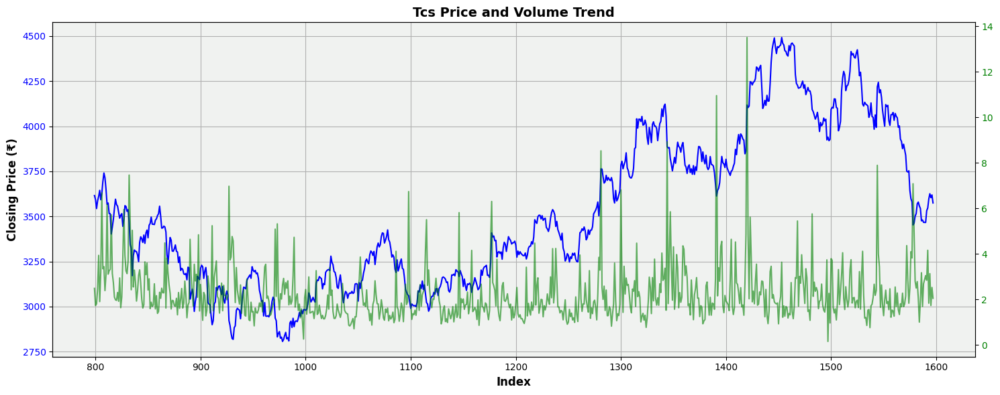

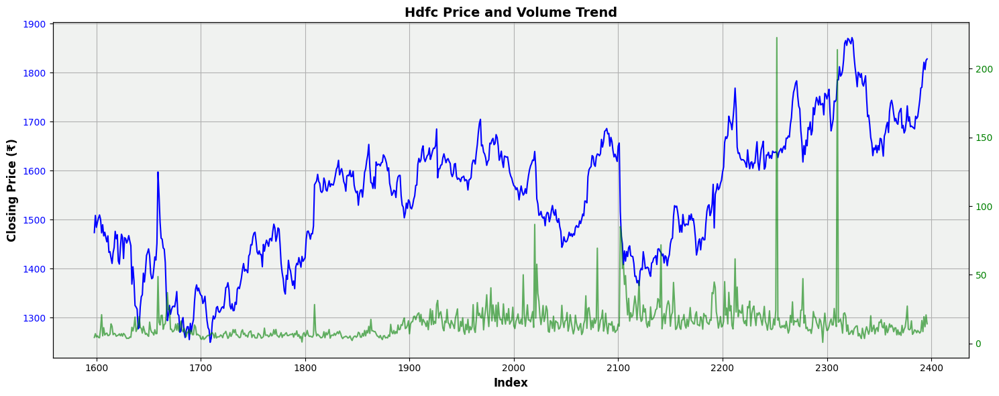

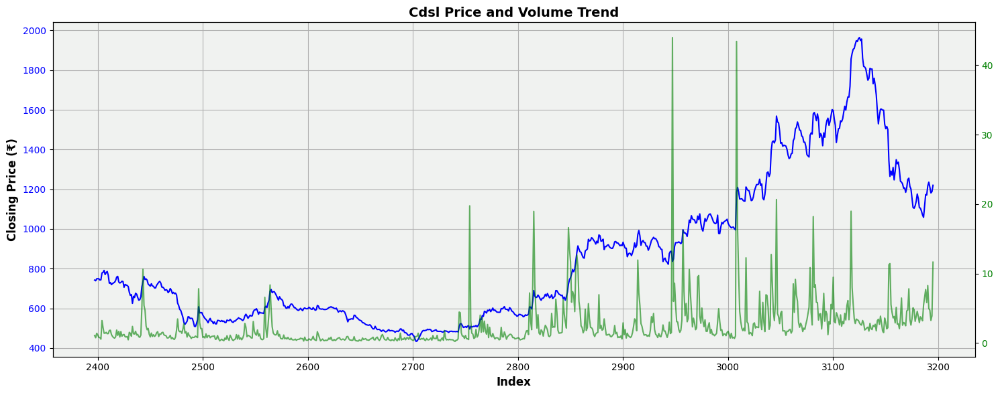

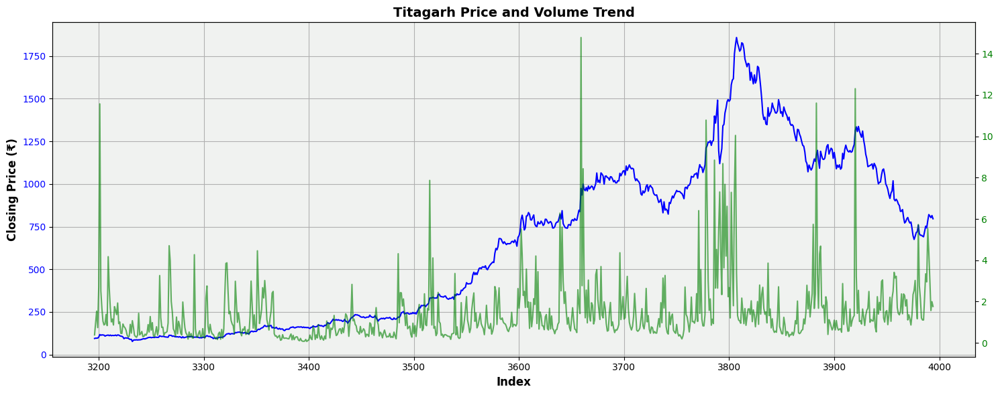

In [39]:
def plot_stock_trend(stock_name):
    stock_data = combined_df[combined_df['Stock Name'] == stock_name].copy()
    fig, ax1 = plt.subplots(figsize=(15, 6))
    ax1.plot(stock_data.index, stock_data['Close'], label='Closing Price (₹)', color='blue')  # Plot closing price on primary y-axis
    ax2 = ax1.twinx()                                                                         # Create secondary y-axis for volume
    ax2.plot(stock_data.index, stock_data['Volume'] / 1_000_000, label='Volume (in Millions)', color='green', alpha=0.6)
    ax1.set_xlabel('Index', fontweight='bold', fontsize=12)
    ax1.set_ylabel('Closing Price (₹)', fontweight='bold', fontsize=12)
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_facecolor("#F0F2F0")
    plt.xticks(size = 10)
    ax1.grid(True)
    ax2.tick_params(axis='y', labelcolor='green')
    plt.title(f'{stock_name} Price and Volume Trend', fontweight='bold', fontsize=14)
    fig.tight_layout()
    plt.show()
for stock in combined_df['Stock Name'].unique():
    plot_stock_trend(stock)

In [40]:
# The charts show varied price and volume trends across five stocks. 
# CDSL and Titagarh experienced strong bullish rallies with CDSL showing more volatility, while Titagarh had a steadier rise.
# Motherson had flat price action despite massive volume spikes, possibly block trades. 
# TCS displayed a stable price trend with low volume, reflecting its nature as a mature, less volatile stock.
# HDFC showed a gradual uptrend with occasional volume-driven fluctuations. 
# Overall CDSL and Titagarh were momentum-driven while TCS and HDFC  towards steady, lower-risk movements.

In [41]:
# Filter for Motherson stock with volume > 300 million   # to verify your chart showing correlty or not
motherson_high_volume = combined_df[                             
    (combined_df['Stock Name'] == 'Motherson') & 
    (combined_df['Volume'] > 300_000_000)
]

In [42]:
motherson_high_volume.round(2)

,Date,Stock Name,Close,High,Low,Open,Volume,Month,weekdays,Daily return
298,2023-03-16,Motherson,67.48,70.24,65.06,70.24,419907533,March,Thursday,-10.81
537,2024-03-06,Motherson,119.86,122.78,116.88,122.78,463323045,March,Wednesday,-3.67


### ▶️Comparative Analysis Performance

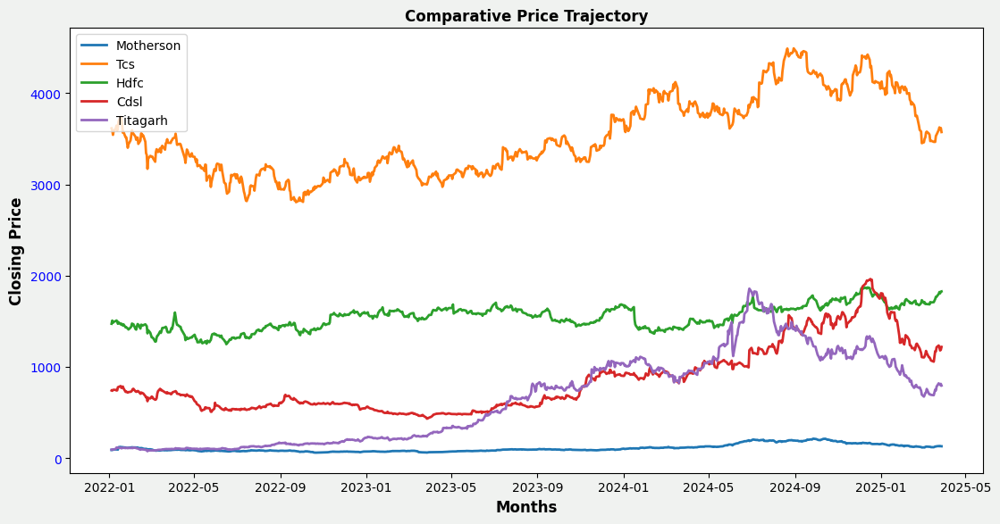

In [43]:
plt.figure(figsize=(29, 22),facecolor="#F0F2F0")
plt.subplot(3,2,1)
for stock in combined_df['Stock Name'].unique():
    stock_data = combined_df[combined_df['Stock Name'] == stock]
    plt.plot(stock_data['Date'], stock_data['Close'], label=stock, linewidth=2)
plt.title('Comparative Price Trajectory',fontweight='bold',fontsize=12)
plt.xlabel('Months',fontweight='bold',fontsize=12)
plt.ylabel('Closing Price',fontweight='bold',fontsize=12)
plt.tick_params(axis='y', labelcolor='blue')
plt.legend(loc='upper left')

In [44]:
#Motherson emerges as the top performer with sustained growth , while CDSL lags
#tcs/Hdfc show stable growth, and Titagarh exhibits volatility, suggesting higher risk-reward.

### ▶️Volume Analysis


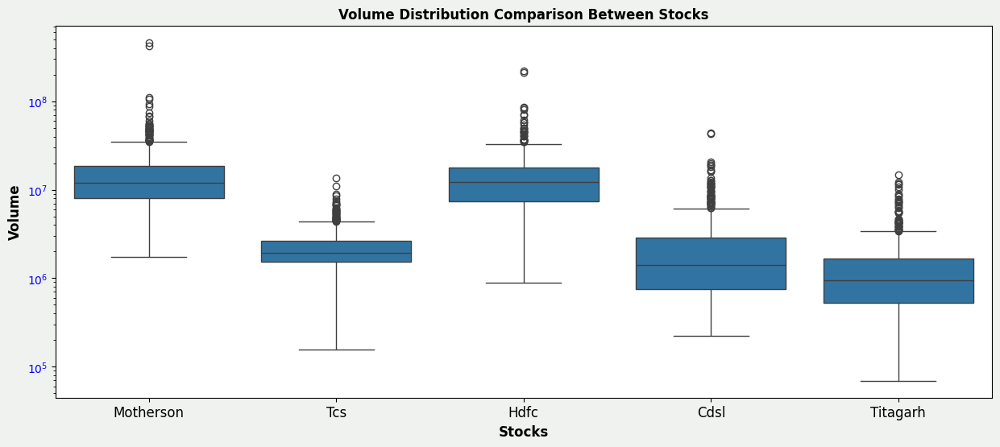

In [45]:
plt.figure(figsize=(15, 6),facecolor="#F0F2F0")
sns.boxplot(x='Stock Name', y='Volume', data=combined_df)
plt.title('Volume Distribution Comparison Between Stocks',fontweight='bold',fontsize=12)
plt.yscale('log')  # Use logarithmic scale for better visibility # Compresses large value ranges (common in stock volumes) to make patterns clearer
plt.ylabel('Volume',fontweight='bold',fontsize=12)
plt.xlabel('Stocks',fontweight='bold',fontsize=12)
plt.tick_params(axis='y', labelcolor='blue')
plt.xticks(size = 12)
plt.show()

In [46]:
# this boxplot provides a visual comparison of the central tendency (median), spread (IQR), and presence of outliers in the trading volume of these five stocks over a certain period. 
# Hdfc and Motherson generally experience higher trading volumes, while Tcs and Titagarh tend to have lower trading volumes.
# All five stocks show the presence of some high-volume outliers.

### ▶️Moving Average Analysis


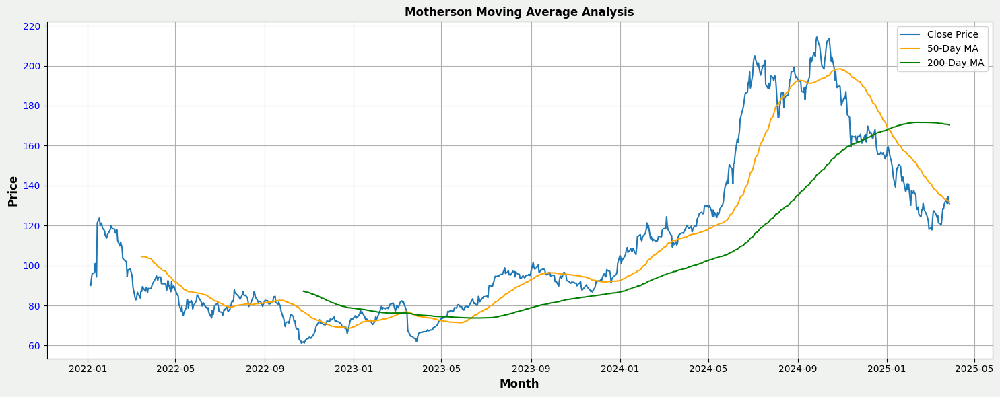

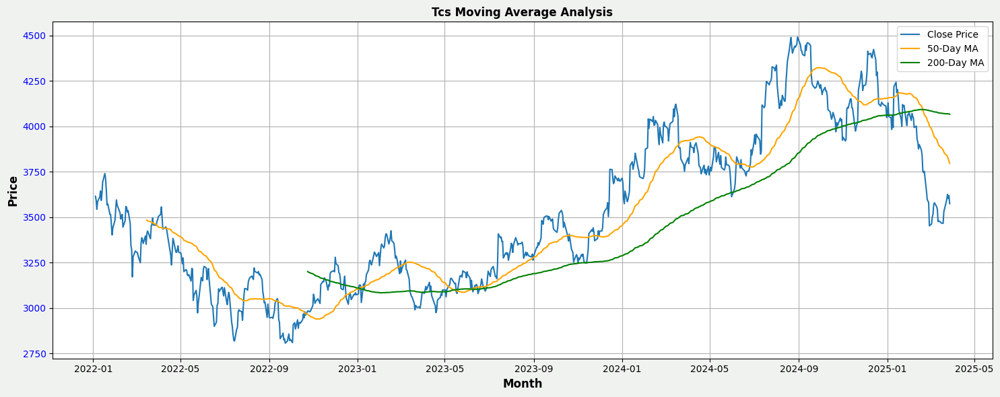

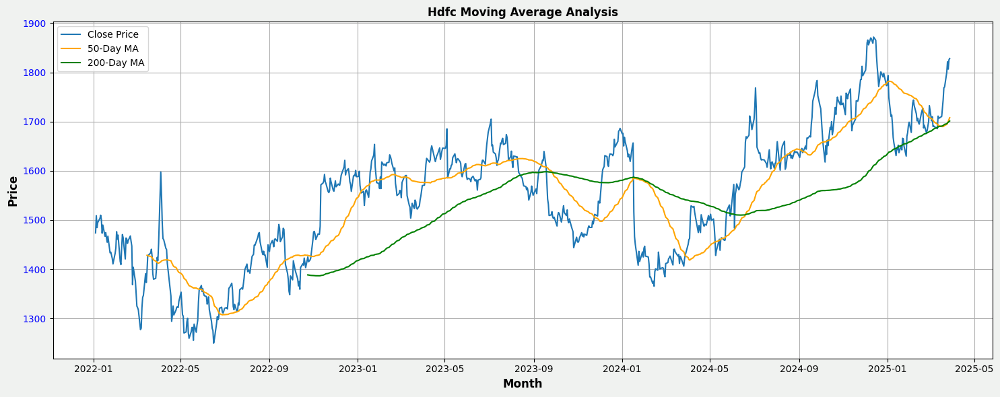

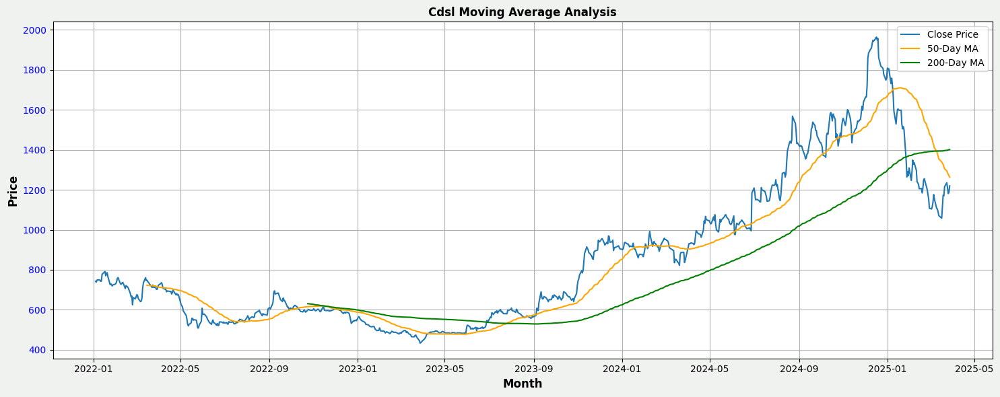

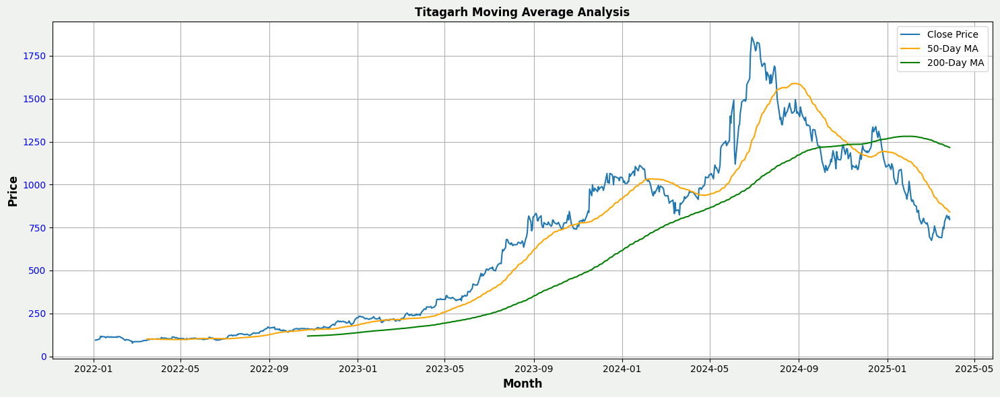

In [47]:
def plot_moving_averages(stock_name):
    stock_data = combined_df[combined_df['Stock Name'] == stock_name].copy()    # Filter for the selected stock
    stock_data.sort_values('Date', inplace=True)                                  # Sort by date 
    stock_data['50_MA'] = stock_data['Close'].rolling(50).mean()                  # Calculate moving averages
    stock_data['200_MA'] = stock_data['Close'].rolling(200).mean()
    plt.figure(figsize=(15, 6),facecolor="#F0F2F0")
    plt.plot(stock_data['Date'], stock_data['Close'], label='Close Price')
    plt.plot(stock_data['Date'], stock_data['50_MA'], label='50-Day MA', color='orange')
    plt.plot(stock_data['Date'], stock_data['200_MA'], label='200-Day MA', color='green')
    plt.title(f'{stock_name} Moving Average Analysis', fontweight='bold', fontsize=12)
    plt.xlabel('Month', fontweight='bold', fontsize=12)
    plt.ylabel('Price', fontweight='bold', fontsize=12)
    plt.tick_params(axis='y', labelcolor='blue')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
for stock in combined_df['Stock Name'].unique():    # Call the function for each stock
    plot_moving_averages(stock)

In [48]:
#Motherson Bullish long-term trend with 50-day MA consistently above 200-day MA but short-term volatility in 2023-24 
#Tcs Bearish phase (50-day MA below 200-day MA) until 2023, recovering to neutral by 2025 
#Hdfc Sideways movement (MAs converge) until 2024, then bullish crossover 
#Cdsl Persistent bearishness  until 2025, showing tentative recovery 
#Titagarh Highly volatile—50-day MA frequently crosses 200-day MA signaling shifting momentum; bullish 2024

### ▶️Price Correlation 

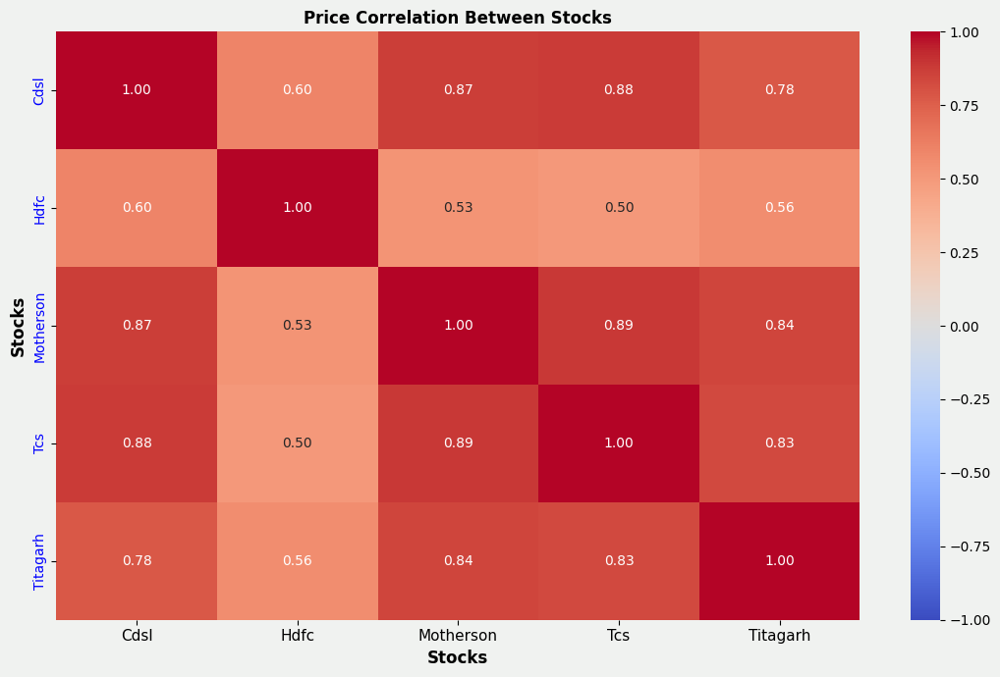

In [49]:
plt.figure(figsize=(11, 7),facecolor="#F0F2F0")
closing_prices = combined_df.pivot(index='Date', columns='Stock Name', values='Close')
correlation_matrix = closing_prices.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
plt.title('Price Correlation Between Stocks',fontweight='bold', fontsize=12)
plt.xlabel("Stocks",fontweight='bold', fontsize=12)
plt.ylabel("Stocks",fontweight='bold', fontsize=12)
plt.tick_params(axis='y', labelcolor='blue')
plt.xticks(size = 11)
plt.tight_layout()
plt.show()

1. Values close to 1: Strong positive relationship (move together)
2. Values close to -1: Strong negative relationship (move opposite)
3. Values near 0: No linear relationship

In [50]:
# Highly Correlated Pairs
#Tcs & Motherson 0.89 and Tcs & Cdsl 0.89 have the highest correlations which implies low diversification benefit if held together
#Motherson & Titagarh 0.84 and Tcs & Titagarh 0.83 also show strong movement

### ▶️Calculate average daily returns & volume by each stock in weekdays 

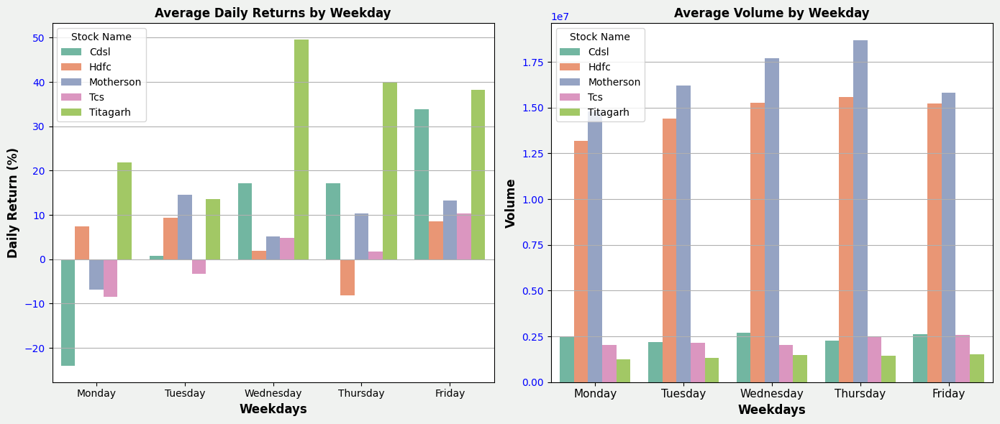

In [51]:
weekday_analysis = combined_df.groupby(['Stock Name', 'weekdays']).agg({'Daily return': 'mean','Volume': 'mean'}).reset_index()
weekday_analysis['Daily return'] *= 100         # Convert Daily Return to percentage
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
plt.figure(figsize=(14, 6), facecolor="#F0F2F0")

# Average Daily Return
plt.subplot(1, 2, 1)
sns.barplot(x='weekdays', y='Daily return', hue='Stock Name', data=weekday_analysis, palette="Set2", order=weekday_order)
plt.title('Average Daily Returns by Weekday', fontweight='bold', fontsize=12)
plt.xlabel('Weekdays', fontweight='bold', fontsize=12)
plt.ylabel('Daily Return (%)', fontweight='bold', fontsize=12)
plt.tick_params(axis='y', labelcolor='blue')
plt.grid(axis='y')

# Average Volume
plt.subplot(1, 2, 2)
sns.barplot(x='weekdays', y='Volume', hue='Stock Name', data=weekday_analysis, palette="Set2", order=weekday_order)
plt.title('Average Volume by Weekday', fontweight='bold', fontsize=12)
plt.xlabel('Weekdays', fontweight='bold', fontsize=12)
plt.ylabel('Volume', fontweight='bold', fontsize=12)
plt.tick_params(axis='y', labelcolor='blue')
plt.xticks(size=11)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [52]:
# Average Daily Return Insights:
# Titagarh shows strong positive returns consistently, especially peaking on wednesday, thursday and friday indicating favorable momentum week’s end.
# Cdsl performs well on Friday and Thursday but has a significant drop on Monday, suggesting potential volatility or profit booking at the week’s start.
# Hdfc and Motherson show relatively stable low returns across weekdays with minor gains 
# Tcs has modest returns, with the highest on friday, but remains fairly neutral across other days

### ▶️Calculate average daily return by weekdays (all stocks)

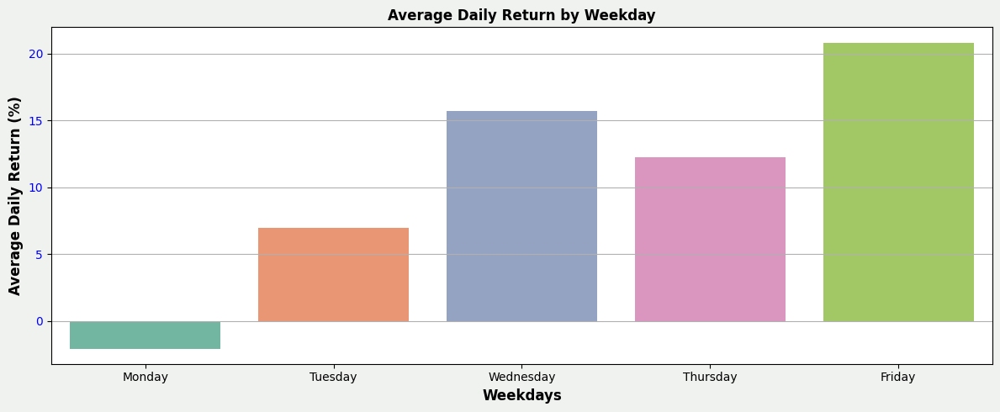

In [53]:
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'] # Define weekday order
avg_return_by_weekday = combined_df.groupby('weekdays')['Daily return'].mean().reindex(weekday_order)# Calculate and sort average daily returns by weekday
avg_return_by_weekday *= 100                                # Convert to percent
plt.figure(figsize=(12, 5),facecolor="#F0F2F0")
sns.barplot(x=avg_return_by_weekday.index, y=avg_return_by_weekday.values, palette="Set2")
plt.title("Average Daily Return by Weekday",fontweight='bold', fontsize=12)
plt.xlabel("Weekdays",fontweight='bold', fontsize=12)
plt.ylabel("Average Daily Return (%)",fontweight='bold', fontsize=12)
plt.tick_params(axis='y', labelcolor='blue')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [54]:
# friday shows the highest average daily return 22% , suggesting it’s the most profitable trading day across all stocks
# monday is the only day with a negative average return, indicating poor performance at the start of the week
# returns increase steadily from Tuesday to Friday, possible end-of-week momentum effect

### ▶️Calculate average daily return by month (all stocks)

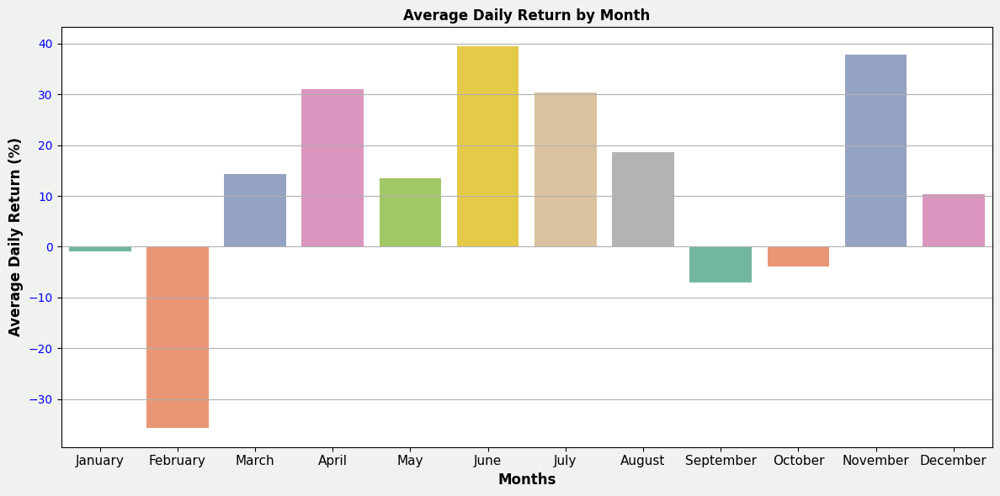

In [55]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June',         # Define  order of months
               'July', 'August', 'September', 'October', 'November', 'December']
avg_return_by_month = combined_df.groupby('Month')['Daily return'].mean().reindex(month_order)   # Calculate average return and reindex by month order
avg_return_by_month *= 100                   # Convert to percentage
plt.figure(figsize=(12, 6),facecolor="#F0F2F0")
sns.barplot(x=avg_return_by_month.index, y=avg_return_by_month.values, palette="Set2")
plt.title("Average Daily Return by Month",fontweight='bold', fontsize=12)
plt.xlabel("Months",fontweight='bold', fontsize=12)
plt.ylabel("Average Daily Return (%)",fontweight='bold', fontsize=12)
plt.tick_params(axis='y', labelcolor='blue')
plt.xticks(size=11)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [56]:
# june and november the highest average returns 38–39%, making them the most profitable months overall
# february stands out with a significant negative return -35%
# The Union Budget, announced on February 1st, often triggers volatility. If the budget includes higher taxes, tight fiscal policy or disappointing reforms it can shake investor confidence
# period from march to july shows strong and consistent gains, a favorable mid-year trend
# September and October reflect slight negative or flat returns, hinting at seasonal slowdowns or market caution

#April,June,July August,November show strong positive returns think of buying or holding positions in these months
#December and may also show good gains for short term investments
# in february you can also think of shortsell


### ▶️Calculate risk-return of stocks

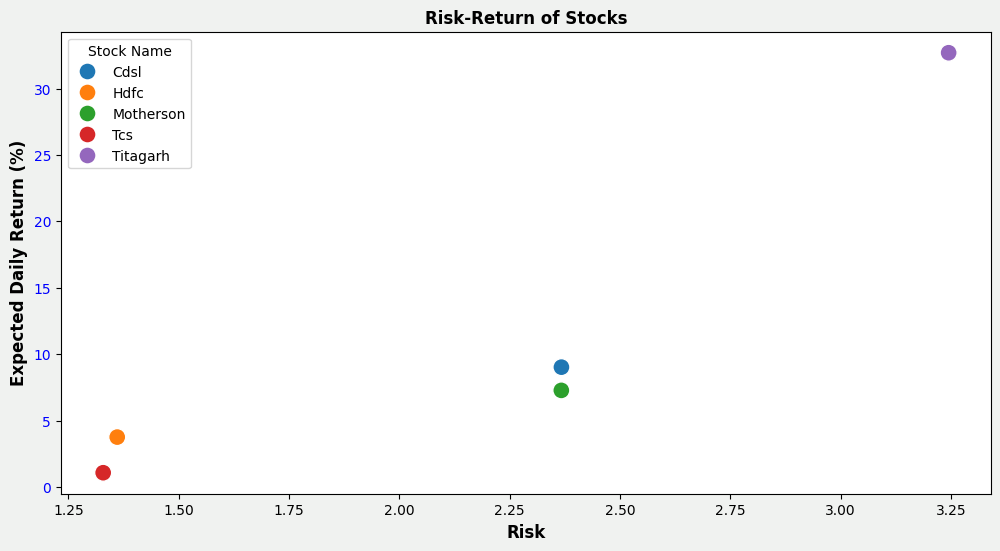

In [57]:
risk_return = combined_df.groupby('Stock Name')['Daily return'].agg(['mean', 'std'])
risk_return = risk_return.rename(columns={'mean':'Expected Return','std':'Risk'})
risk_return['Expected Return'] *= 100  # Convert expected return to percent
plt.figure(figsize=(12, 6),facecolor="#F0F2F0")
sns.scatterplot(x='Risk', y='Expected Return', hue=risk_return.index,data=risk_return,s = 150)
plt.title('Risk-Return of Stocks',fontweight='bold',fontsize=12)
plt.xlabel('Risk',fontweight='bold',fontsize=12)
plt.ylabel('Expected Daily Return (%)',fontweight='bold',fontsize=12)
plt.tick_params(axis='y',labelcolor='blue')
plt.show()

In [58]:
# titagarh offers the highest expected return 32% but also carries the highest risk 3.25, making it a high-risk, high-reward stock
# Cdsl and Tcs strike a better risk-return balance, offering moderate returns 7–9% with manageable risk 2.4
# Hdfc and Motherson have the lowest risk 1.3 but also the lowest returns 1.5–4%

<div style="background-color:#818274; padding: 25px; border-radius: 10px; font-size: 20px; font-family: 'Trebuchet MS', serif; text-align: center;">
  <h1 style="color: #FFFFFF;">⭐️ T H A N K    Y O U ! ⭐️</h1>
</div>